![logo](../../../logoline_c3s.svg)

# Intercomparison of satellite multi-year sea ice extent estimates 

Production date: 19-05-2025 

Produced by: Timothy Williams (Nansen Environmental and Remote Sensing Center; NERSC) and Fabio Mangini (Nansen Environmental and Remote Sensing Center; NERSC) 

## 🌍 Use case: Monitoring long-term evolution of sea ice type

## ❓ Quality assessment question
* **How consistent is the evolution of multi-year sea-ice extent in the Arctic across different satellite sea-ice products?**

This study examines the geographical distribution of multi-year sea ice (MYI) in the Arctic, providing an analysis of its evolution since the early 1990s. The assessment focuses on multi-year sea ice, which is sea ice that has survived at least one melting season, because its extent in the Arctic has significantly declined over the last few decades (e.g., [[1]](https://doi.org/10.1029/2011GL047735)). Changes in MYI extent are of interest because of the repercussions they have on the Earth's climate which, in turn, can impact the Arctic ecosystem and affect human activities in the region (e.g., [[2]](https://www.cambridge.org/core/books/ocean-and-cryosphere-in-a-changing-climate/polar-regions/8D76B8865B796C16991F7A9FB6271C2D)). 

The assessment uses two different sea-ice products. This choice helps determine the robustness of the results and highlight the properties of the two datasets. The first dataset, referred to as "CDS dataset", provides information on sea-ice types in the region, while the second, the "NERSC dataset", classifies sea ice into age categories. 

Both datasets indicate a general decrease in Arctic multi-year sea ice extent over the last three decades, especially in the Beaufort Sea, the Chukchi Sea, and the Eurasian Basin. However, they show several differences on a regional scale. For example, compared to the CDS dataset, the NERSC dataset reports a consistent higher presence of multi-year sea ice in the Greenland Sea away from the coast. 

## 📢 Quality assessment statement

```{admonition} These are the key outcomes of this assessment
:class: note

* Both the CDS and the NERSC datasets reveal an overall decrease in multi-year sea ice extent over the Arctic since 1991, with the most significant reductions occurring in the Beaufort Sea, the Chukchi Sea, and the Eurasian Basin.  

* Despite their consistent conclusions, notable differences exist between the two datasets. Specifically, the CDS dataset tends to overestimate multi-year sea ice presence in the Beaufort Sea and underestimate it in the Greenland Sea when compared to the NERSC dataset. It is shown that these discrepancies tend to be minimum in October and to become more pronounced as each winter progresses. 

* The inclusion of "ambiguous" data points in the CDS dataset has two main implications on the estimates of multi-year sea ice extent in the Arctic. At first, it affects the total amount of multi-year sea ice in the region, even though it only little alters its geographic distribution. Secondly, it increases its day-to-day variability. 
```

## 📋 Methodology

The evolution of multi-year sea ice extent in the Arctic is based on two different datasets. This choice helps show the properties of the two products as well as assessing the robustness of the results. The first dataset is freely available on the Copernicus Climate Data Store (CDS) website under the name ["Sea ice edge and type daily gridded data from 1978 to present derived from satellite observations"](https://cds.climate.copernicus.eu/datasets/satellite-sea-ice-edge-type?tab=overview). The data provides information on sea-ice types in the Arctic Ocean by classifying sea ice into four categories: "open water", "first-year ice", "multi-year ice", and "ambiguous". The classification primarily relies on brightness temperature observed by passive microwave radiometers. For the purposes of this Notebook, only the subset of the dataset labelled as Climate Data Records (CDRs) is considered, thereby excluding the Interim Climate Data Records (ICDRs). The ICDRs have been excluded from this work because their consistency has not been as thoroughly verified as that of the CDRs.

The second dataset is described by [[3]](https://tc.copernicus.org/articles/12/2073/2018/) and is provided by Dr. Anton Korosov (anton.korosov@nersc.no) on request. This dataset differs from the previous one as it uses an Eulerian advection scheme, together with passive-microwave-derived concentration and drift estimations, to classify sea ice into age categories, instead of ice types. Specifically, the dataset provides an estimate of sea-ice age over the Arctic, and an estimate of individual ice-age fractions at each grid point. For convenience, the former dataset will be referred to as "CDS dataset" whereas the latter as "NERSC dataset". 

The assessment uses two distinct approaches to identify the grid points characterized by multi-year sea ice in the CDS and in the NERSC datasets. In the CDS dataset, the presence of multi-year sea ice is determined using two different criteria: first, by selecting the pixels classified as "multi-year ice", and second, by considering the pixels classified as both "multi-year ice" and "ambiguous". The results obtained with these two criteria are then compared to highlight the role of the pixels classified as ambiguous. Instead, in the NERSC dataset, multi-year sea ice is identified by selecting the pixels where the concentration of first-year sea ice (FYI) does not exceed that of sea ice that is older than one year, and where the sum of the two exceeds 30% (where there is some ice present). Note that this threshold, which is usually 15%, is chosen to be consistent with the CDS product. 

The analysis is performed on the overlapping interval of the two datasets during the boreal winters between October 1991 and April 2020, where with boreal winter we refer to the period ranging from the 1st of October of one year to the 30th of April of the following year. The upper limit is set by the CDS dataset, which provides information on sea-ice types for the boreal winter months between October 1978 and December 2020, whereas the lower limit is set by the NERSC dataset, which covers the period from September 1991 to May 2023. 

The "Analysis and results" section is structured as follows:

**[](satellite_satellite-sea-ice-edge-type_intercomparison_q01:section-1)**

**[](satellite_satellite-sea-ice-edge-type_intercomparison_q01:section-2)**

**[](satellite_satellite-sea-ice-edge-type_intercomparison_q01:section-3)**

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;**[](satellite_satellite-sea-ice-edge-type_intercomparison_q01:section-3.1)**

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;We present and compare the temporal evolution of the area covered by multi-year sea ice over the Arctic Basin as provided by the CDS and the NERSC datasets. This section also quantifies the mismatch between the two datasets by analysing the bias and the integrated ice type error (IITE) of the NERSC dataset relative to CDS dataset. The bias is the difference between the area where the CDS dataset reports multi-year sea ice while the NERSC dataset does not, and the area where the CDS dataset does not report multi-year sea ice while the NERSC dataset does. Instead, the integrated ice type error is the sum of these two areas.

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;**[](satellite_satellite-sea-ice-edge-type_intercomparison_q01:section-3.2)**

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;We investigate further the temporal evolution of multi-year sea ice in the Arctic with the help of maps. Specifically, we present and compare, for each dataset, month and pixel, the percentage of days associated with multi-year sea ice over three decades.

## 📈 Analysis and results

(satellite_satellite-sea-ice-edge-type_intercomparison_q01:section-1)=
### 1. Parameters, requests and functions definition
- Define the parameters and formulate the requests for downloading with the EQC toolbox.
- Define the functions to process and reduce the size of the downloaded data.
- Define the functions to post-process and visualize the data.

#### 1.1 Import libraries
Define the code to import the required libraries.

In [1]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import pandas as pd
import xarray as xr
from c3s_eqc_automatic_quality_control import download, plot
import calendar
import numpy as np
from scipy.interpolate import interp1d

plt.style.use("seaborn-v0_8-notebook")

#### 1.2 Set Parameters
- set the years to use for the climatologies with `periods`. These years are also used to define the length of the time series.
- set `conc_threshold`, the concentration threshold to determine the presence of sea ice in the NERSC product.
- set the path to the NERSC ice age product with `NERSC_path`.

In [2]:
# Define time periods
periods = [
    slice(1991, 2000),
    slice(2001, 2010),
    slice(2011, 2019),
]

# Concentration threshold to determine the presence of sea ice in the NERSC product
conc_threshold = 30 # %

# Define path to NERSC data
NERSC_PATH = "/data/wp5/mangini_fabio/nersc_ice_age_v2p1"

#### 1.3 Define requests
Define the requests to be submitted to the CDS.

In [3]:
collection_id = "satellite-sea-ice-edge-type"


def get_requests(year_start, year_stop):
    common_request = {
        "cdr_type": "cdr",
        "variable": "sea_ice_type",
        "region": "northern_hemisphere",
        "version": "3_0",
        "day": [f"{day:02d}" for day in range(1, 32)],
    }
    return [
        common_request
        | {
            "year": [str(year) for year in range(year_start, year_stop)],
            "month": [f"{month:02d}" for month in range(10, 13)],
        },
        common_request
        | {
            "year": [str(year + 1) for year in range(year_start, year_stop)],
            "month": [f"{month:02d}" for month in range(1, 5)],
        },
    ]

request_timeseries = get_requests(
    year_start=min([period.start for period in periods]),
    year_stop=max([period.stop for period in periods]),
)

requests_periods = {}
for period in periods:
    label = f"Oct {period.start} - Apr {period.stop+1}"
    requests_periods[label] = get_requests(period.start, period.stop)

#### 1.4 Functions to load and classify NERSC data
- `get_nersc_data` loads the NERSC data for a period corresponding to a set CDS data.
- `get_nersc_multiyear_ice` processes the NERSC data to produce a mask of multi-year sea ice.

In [4]:
def get_nersc_data(ds_cds, nersc_path):
    if nersc_path is None:
        nersc_path = NERSC_PATH

    paths = ds_cds["time"].dt.strftime(
        f"{nersc_path}/%Y/arctic25km_sea_ice_age_v2p1_%Y%m%d.nc"
    )
    ds_nersc = xr.open_mfdataset(
        set(paths.values),
        concat_dim="time",
        combine="nested",
        data_vars="minimal",
        coords="minimal",
        compat="override",
    )
    ds_nersc = ds_nersc.rename(x="xc", y="yc")
    ds_nersc = ds_nersc.assign_coords(
        {coord: ds_cds[coord] for coord in ("xc", "yc", "longitude", "latitude")}
    )
    return ds_nersc


def get_nersc_multiyear_ice(
    ds_cds,
    use_fyi,
    age_threshold,
    conc_threshold,
    nersc_ice_age_path,
):
    ds_nersc = get_nersc_data(ds_cds, nersc_ice_age_path)

    if age_threshold is not None:
        assert not use_fyi
        assert conc_threshold is None
        return ds_nersc["sia"] > age_threshold

    assert conc_threshold is not None

    conc_myi = ds_nersc["conc_2yi"]
    n = 3
    while (varname := f"conc_{n}yi") in ds_nersc.variables:
        conc_myi += ds_nersc[varname].fillna(0)
        n += 1

    if not use_fyi:
        return conc_myi > conc_threshold

    conc_fyi = ds_nersc["conc_1yi"]
    return ((conc_myi + conc_fyi) > conc_threshold) & (conc_myi > conc_fyi)

#### 1.5 Functions to produce time series
- `get_classification_mask` processes the CDS data to produce a mask of multi-year sea ice.
- `mask_outside_central_arctic` defines a mask based on a manually defined set of maximum latitudes. This mask is `False` if a pixel should be included in the calculation of MYI extent and error statistics and `True` if it shouldn't.
- `compute_spatial_sum` computes the area corresponding to a given boolean array on an equal-area grid.
- `compute_sea_ice_evaluation_diagnostics` computes the multi-year sea ice extent for the NERSC and the CDS products, the bias and the integrated ice type error between them.

In [5]:
def get_classification_mask(ds, use_ambiguous):
    da = ds["ice_type"]
    return (da >= 3) if use_ambiguous else (da == 3)


def mask_outside_central_arctic(obj):
    lon_pts, lat_pts = np.array([
        [-128.9355, 70.9883], # end of Canadian Archipelago
        [-121.5527, 77.7489],
        [-103.5352, 79.7967],
        [-94.4824, 81.8861],
        [-74.7949, 83.5301],
        [-60.3809, 82.6538],
        [-32.3438, 84.0526],
        [-10.3711, 81.6724],
        [10.1074, 80.0277],
        [25.1367, 71.131], # near Gjesvaer Norway
    ]).T
    interp_func = interp1d(lon_pts, lat_pts, kind='linear', fill_value=np.nan, bounds_error=False)

    lon, lat = xr.broadcast(obj['longitude'], obj['latitude'])
    lat_threshold = xr.apply_ufunc(
        interp_func, lon,
        input_core_dims=[[]],
        vectorize=True,
        dask="parallelized",
        output_dtypes=[float]
    )
    return (lat < lat_threshold) & lat_threshold.notnull()


def compute_spatial_sum(da, grid_cell_area, dim=("xc", "yc")):
    return grid_cell_area * da.sum(dim=dim)


def compute_sea_ice_evaluation_diagnostics(
    ds,
    use_ambiguous,
    use_fyi,
    age_threshold,
    conc_threshold,
):
    # grid cell area of sea ice edge grid
    (dx,) = set(ds["xc"].diff("xc").values)
    grid_cell_area = (dx**2) * 1.0e-6  # 10^6 km2

    # Mask for inside central Arctic
    mask = ~mask_outside_central_arctic(ds)

    # Masks for MYI
    da_cds = get_classification_mask(ds, use_ambiguous) & mask
    da_nersc = get_nersc_multiyear_ice(
        ds,
        use_fyi=use_fyi,
        age_threshold=age_threshold,
        conc_threshold=conc_threshold,
        nersc_ice_age_path=None,
    ) & mask

    # Fill variables
    units = "$10^6$km$^2$"
    dataarrays = {}
    dataarrays["mysi_extent"] = compute_spatial_sum(da_cds, grid_cell_area)
    dataarrays["mysi_extent"].attrs = {
        "standard_name": "multi_year_sea_ice_extent",
        "units": units,
        "long_name": "Multi-year sea ice extent from CDS dataset",
    }

    dataarrays["mysi_extent_age"] = compute_spatial_sum(da_nersc, grid_cell_area)
    dataarrays["mysi_extent_age"].attrs = {
        "standard_name": "multi_year_sea_ice_extent_age",
        "units": units,
        "long_name": "Multi-year sea ice extent from NERSC sea ice age product",
    }

    over = compute_spatial_sum(da_cds & ~da_nersc, grid_cell_area)
    under = compute_spatial_sum(~da_cds & da_nersc, grid_cell_area)
    dataarrays["mysi_extent_bias"] = over - under
    dataarrays["mysi_extent_bias"].attrs = {
        "standard_name": "multi_year_sea_ice_extent_bias",
        "units": units,
        "long_name": "Multi-year sea ice extent bias",
    }

    dataarrays["iite"] = over + under
    dataarrays["iite"].attrs = {
        "standard_name": "integrated_ice_type_error",
        "units": units,
        "long_name": "Integrated ice type error",
    }
    return xr.Dataset(dataarrays)

#### 1.6 Functions to post-process and plot time series
- `rearrange_year_vs_monthday` groups a long time series by year and day of year.
- `split_dataset_ambiguous` splits a dataset into one dataset that depends on whether the ambiguous pixels in the CDS dataset are used, and another dataset that does not depend on this.
- `plot_against_monthday` plots the timeseries against the day-of-year by year, with a different colour for each year.

In [6]:
def rearrange_year_vs_monthday(ds):
    ds = ds.convert_calendar("noleap")
    year = ds["time"].dt.year
    year = year.where(ds["time"].dt.month >= 10, year - 1)
    coords = {
        "year": ("time", year.values),
        "monthday": ("time", ds["time"].dt.strftime("%m-%d").values),
    }
    ds = ds.assign_coords(coords)
    return ds.set_index(time=tuple(coords)).unstack("time")
    
    
def split_dataset_ambiguous(ds_timeseries):
    ds_timeseries_doy = rearrange_year_vs_monthday(ds_timeseries)
    ds_no_ambig = (ds_timeseries_doy["mysi_extent"].sel(use_ambiguous=True)
                  - ds_timeseries_doy["mysi_extent"].sel(use_ambiguous=False)
                  ).to_dataset().rename_vars({"mysi_extent": "ambiguous_extent"})
    ds_no_ambig["ambiguous_extent"].attrs = {
        "standard_name": "ambiguous_extent",
        "long_name": "Ambiguous Extent",
        "units": "$10^6$km$^2$",
    }
    ds_no_ambig["mysi_extent_age"] = ds_timeseries_doy["mysi_extent_age"].mean(
        dim="use_ambiguous", keep_attrs=True)
    return ds_timeseries_doy.drop_vars(["mysi_extent_age"]), ds_no_ambig


def plot_against_monthday(ds, single_row=False, cmap="viridis", **kwargs):
    defaults = {
        "row": "variable",
        "col": "use_ambiguous",
        "x": "time",
        "hue": "year",
        "add_legend": False,
        "figsize": (27, 18),
        "sharey": 'row',
    }
    cbar_kwargs = {
        "label": "Year",
        "shrink": .7,
    }
    if single_row:
        defaults |= {
            "row": None,
            "col": "variable",
            "figsize": (15, 4),
            "sharey": False,
        }
        cbar_kwargs |= {
            "pad": 0.025,
            "shrink": 1,
        }
    
    da = ds.to_array()
    time = pd.to_datetime(
        [
            f"200{'1' if int(monthday[:2]) >= 10 else '2'}-{monthday}"
            for monthday in da["monthday"].values
        ]
    )
    da = da.assign_coords(time=("monthday", time)).sortby("time")
    colors = plt.get_cmap(cmap, da.sizes["year"]).colors
    with plt.rc_context({"axes.prop_cycle": plt.cycler(color=colors)}):
        facet = da.plot(**(defaults | kwargs))

    for i, (ax, sel_dict) in enumerate(zip(facet.axs.flatten(), facet.name_dicts.flatten())):
        ax.grid()
        ax.set_xlabel('')
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%d %b"))
        ax.xaxis.set_tick_params(labelsize=15, rotation=45)
        if not single_row:
            continue

        title = ds[sel_dict["variable"]].attrs["long_name"].replace(" NERSC", "\nNERSC")
        ax.set_title(title, fontsize=18)
        if i == 0:
            label = "[%s]" %ds[sel_dict["variable"]].attrs["units"]
            ax.set_ylabel(label, fontsize=15)

    scalar_mappable = plt.cm.ScalarMappable(
        cmap=cmap,
        norm=plt.Normalize(vmin=da["year"].min(), vmax=da["year"].max()),
    )
    cbar = facet.fig.colorbar(scalar_mappable, ax=facet.axs, **cbar_kwargs) 
    cbar.ax.tick_params(labelsize=15)
    cbar.ax.yaxis.label.set_fontsize(15)

    if single_row:
        return

    for ax in facet.axs[0,:]:
        ax.title.set_fontsize(18)

    for ax in facet.axs[:, 0]:
        label = "[%s]" %ds[sel_dict["variable"]].attrs["units"]
        ax.set_ylabel(label, fontsize=15)
        ax.yaxis.set_tick_params(labelsize=15)

    for label in facet.row_labels:
        *_, variable = label.get_text().split()
        long_name = ds[variable].attrs["long_name"].replace("from", "from\n")            
        label.set_text(long_name)
        label.set_fontsize(15)

    for label in facet.col_labels:
        txt = "U" if "true" in label.get_text().lower() else "Not u"
        txt += "sing ambiguous pixels"
        label.set_text(txt)
        label.set_fontsize(15)

#### 1.7 Functions to produce climatologies
- `compute_multiyear_ice_percentage` groups daily MYI masks by month and calculates the proportion of each month that a pixel contains MYI.
- `compute_cds_multiyear_ice_percentage` is a wrapper to call `compute_multiyear_ice_percentage` for CDS data.
- `compute_nersc_multiyear_ice_percentage` is a wrapper to call `compute_multiyear_ice_percentage` for NERSC data.

In [7]:
def compute_multiyear_ice_percentage(da):
    da = da.groupby("time.month").map(
        lambda da: 100 * da.sum("time") / da.sizes["time"]
    )
    da.attrs = {
        "units": "%",
        "long_name": "Multi-year sea ice percentage",
    }
    return da.to_dataset(name="percentage")


def compute_cds_multiyear_ice_percentage(ds, use_ambiguous):
    da = get_classification_mask(ds, use_ambiguous)
    return compute_multiyear_ice_percentage(da)


def compute_nersc_multiyear_ice_percentage(ds, use_fyi, age_threshold, conc_threshold):
    da = get_nersc_multiyear_ice(
        ds,
        use_fyi=use_fyi,
        age_threshold=age_threshold,
        conc_threshold=conc_threshold,
        nersc_ice_age_path=None,
    )
    return compute_multiyear_ice_percentage(da)

#### 1.8 Functions to plot climatologies
- `plot_maps` plots multiple maps of either MYI percentage or the difference between the CDS and NERSC products.
- `plot_cds_maps` is a wrapper that calls `plot_maps` for CDS data.
- `plot_masked_data_cds` plots an example map to show the masked region used to calculate the time series.
- `plot_bias_maps` plots multiple maps of the difference between the CDS and NERSC products.

In [8]:
def plot_maps(da, coastline_color='k', title=None, **kwargs):
    defaults = {
        "col": "period",
        "row": "month",
        "projection": ccrs.Stereographic(central_latitude=90.0),
        "cmap": cmocean.cm.ice,
        "cbar_kwargs": {
            "shrink" : .4,
            "pad": .1,
            "anchor": (0,.5), # .5 to center vertically
        },
    }
    da = da.sel(
        xc=slice(-2.5e3, 2.5e3),
        yc=slice(2.5e3, -2.5e3),
        month=[10, 11, 12, 1, 2, 3, 4],
    )
    da["month"] = [calendar.month_abbr[i] for i in da["month"].values]
    facet = plot.projected_map(da, **(defaults | kwargs))
    for ax in facet.axs.flatten():
        ax.coastlines(color=coastline_color, lw=1)
        ax.add_feature(cfeature.LAND, zorder=5, color='gainsboro')
        ax.patch.set_edgecolor('black')  
        ax.patch.set_linewidth(3) 
   
    for ax in facet.axs[0,:]:
        ax.title.set_fontsize(15)

    for i, label in enumerate(facet.col_labels):
        long_name = da["period"].values[i]
        label.set_text(long_name)
        label.set_fontsize(15)
    for _, label in enumerate(facet.row_labels):
        label.set_fontsize(15)

    facet.cbar.ax.tick_params(labelsize=15)
    facet.cbar.ax.yaxis.label.set_fontsize(15)
    facet.set_titles(template="{value}")
    
    return facet


def plot_cds_maps(ds_cds, ambiguous, **kw_sup):
    facet = plot_maps(ds_cds["percentage"].sel(use_ambiguous=ambiguous))
    facet.fig.suptitle(f"CDS MYI percentage;{'' if ambiguous else ' not'} using ambiguous pixels", **kw_sup)
    plt.show()


def plot_masked_data_cds(ds_cds):
    # select a map to plot to illustrate the masked area
    sel_dict = dict(
        use_ambiguous=False,
        month=1,
        period = ds_cds.period[1],
        xc=slice(-2.5e3, 2.5e3),
        yc=slice(2.5e3, -2.5e3),
    )
    da = ds_cds["percentage"].sel(sel_dict)
    da = da.where(~mask_outside_central_arctic(da))
    
    ax = plot.projected_map(da, projection=ccrs.Stereographic(central_latitude=90.0), cmap=cmocean.cm.ice, show_stats=False).axes
    ax.coastlines(color='k', lw=1)
    ax.add_feature(cfeature.LAND, zorder=5, color='gainsboro')
    ax.patch.set_edgecolor('black')  
    ax.patch.set_linewidth(3)

    title = sel_dict['period'].item().split()
    title.remove("Oct")
    title.remove("Apr")
    title.insert(0, calendar.month_abbr[sel_dict["month"]])
    title = " ".join(title) + ";"
    if not sel_dict['use_ambiguous']:
        title += " not"
    ax.set_title(title + " using ambiguous data")
    plt.show()


def plot_bias_maps(da_bias, ambiguous, **kw_sup):
    facet = plot_maps(
        da_bias.sel(use_ambiguous=ambiguous), cmap=cmocean.cm.balance, center=0, robust=True, vmin=-30, vmax=30,
    )
    facet.fig.suptitle(f"Bias (CDS - NERSC);{'' if ambiguous else ' not'} using ambiguous pixels", **kw_sup)
    plt.show()

(satellite_satellite-sea-ice-edge-type_intercomparison_q01:section-2)=
### 2. Download and transform data
Here we download the sea ice type data and transform it to create the time series and climatology maps. The NERSC data should already be available locally.

In [9]:
nersc_kwargs = {
    "use_fyi": True,
    "age_threshold": None,
    "conc_threshold": conc_threshold / 100,
}
download_kwargs = {
    "chunks": {"year": 1},
    "concat_dim": "time",
    "combine": "nested",
    "data_vars": "minimal",
    "coords": "minimal",
    "compat": "override",
}

In [ ]:
# Timeseries
datasets = []
for use_ambiguous in (True, False):
    print(f"Timeseries: {use_ambiguous=}")
    ds = download.download_and_transform(
        collection_id,
        request_timeseries,
        transform_func=compute_sea_ice_evaluation_diagnostics,
        transform_func_kwargs=nersc_kwargs | {"use_ambiguous": use_ambiguous},
        **download_kwargs,
    )
    datasets.append(ds.expand_dims(use_ambiguous=[use_ambiguous]).compute())
ds_timeseries_ambig, ds_timeseries_no_ambig  = split_dataset_ambiguous(xr.concat(datasets, "use_ambiguous"))
del datasets

In [ ]:
# NERSC Maps
datasets = []
for period, requests in requests_periods.items():
    print(f"NERSC Maps: {period=}")
    ds = download.download_and_transform(
        collection_id,
        requests,
        transform_func=compute_nersc_multiyear_ice_percentage,
        transform_func_kwargs=nersc_kwargs,
        transform_chunks=False,
        **download_kwargs,
    )
    datasets.append(ds.expand_dims(period=[period]))
ds_nersc = xr.concat(datasets, "period")

In [ ]:
# CDS Maps
datasets = []
for period, requests in requests_periods.items():
    for use_ambiguous in (True, False):
        print(f"CDS Maps: {period=} {use_ambiguous=}")
        ds = download.download_and_transform(
            collection_id,
            requests,
            transform_func=compute_cds_multiyear_ice_percentage,
            transform_func_kwargs={"use_ambiguous": use_ambiguous},
            transform_chunks=False,
            **download_kwargs,
        )
        datasets.append(ds.expand_dims(use_ambiguous=[use_ambiguous], period=[period]))
ds_cds = xr.merge(datasets)

# Bias compared to NERSC product
with xr.set_options(keep_attrs=True):
    da_bias = (ds_cds - ds_nersc)["percentage"]
da_bias.attrs["long_name"] = "Bias of " + da_bias.attrs["long_name"]

(satellite_satellite-sea-ice-edge-type_intercomparison_q01:section-3)=
### 3. Results

The temporal evolution of multi-year sea ice extent over the Arctic is analysed using a combination of plots and maps. The plots help quantify and compare the temporal evolution of the Arctic multi-year sea ice extent provided by the two datasets, while the maps help explain the differences between the two datasets by identifying the regions where the two products differ the most.  

(satellite_satellite-sea-ice-edge-type_intercomparison_q01:section-3.1)=
#### 3.1 Temporal evolution of the total area covered by multi-year sea ice in the Arctic Basin

The map below shows the area over which the Arctic MYI extent is calculated to produce the plots. We should note that the MYI extent is computed over the Arctic Basin, therefore excluding the narrow straits and the Greenland Sea. This choice was made to ensure that the NERSC dataset was able to permit MYI in the selected region. For example, it may not be capable of advecting multi-year sea ice through narrow straits, such as the Nares Strait west of Greenland and the northern Canadian Archipelago.  

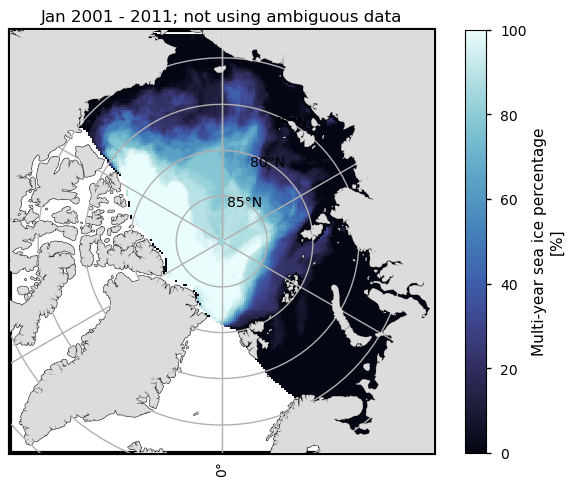

In [13]:
plot_masked_data_cds(ds_cds)

The figure below consists of two plots. The plot on the left displays, for each boreal winter between October 1991 and April 2020, the daily area where the sea-ice type from the CDS dataset is set to ambiguous. The plot on the right follows the same structure, but shows the daily MYI extent as provided by the NERSC dataset.  

The ambiguous MYI extent increases as each boreal winter progresses, with the rise accelerating in spring. This results from the CDS product performing better during the cold and stable mid-winter months than in the warmer spring months, when melting and other factors disrupt the distinction between classes. In addition, the CDS product uses drift tracking from the summer minimum to confirm the presence of MYI, and the error in this drift would also accumulate over the winter.

Interestingly, the ambiguous MYI extent does not experience a long-term change, despite the MYI extent decreasing over the period considered, as shown by the figure to the right and the ones below (introduced and discussed later). 

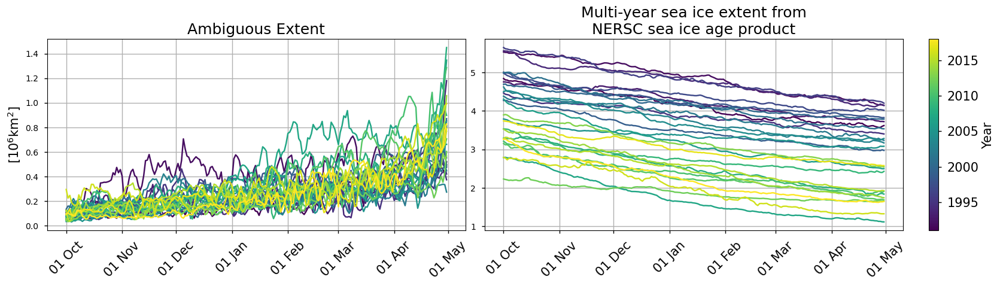

In [14]:
plot_against_monthday(ds_timeseries_no_ambig, single_row=True, figsize=(18, 4.2))
plt.show()

The figure below consists of six plots, arranged in a grid of three rows and two columns. The first row displays the daily MYI extent for each boreal winter between October 1991 and April 2020, estimated from the CDS dataset. The second row shows the difference ("bias") between the CDS and the NERSC datasets, while the third row shows the corresponding integrated ice type error. The columns distinguish between the two definitions of multi-year sea ice for the CDS dataset. The right column shows the results based solely on the grid points labelled as "multi-year ice", whereas the left column shows results based on the grid points labelled as either "multi-year ice" or "ambiguous". 

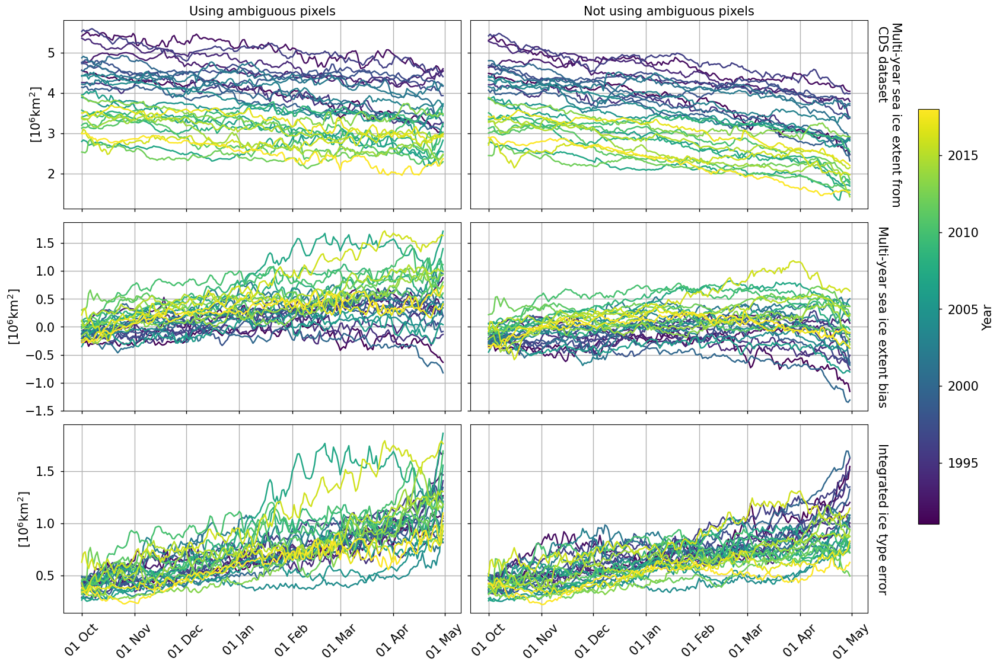

In [15]:
plot_against_monthday(ds_timeseries_ambig, figsize=(18,11))
plt.show()

The comparison between the MYI extent from the CDS and the NERSC datasets yields comparable results, and the inclusion of the grid points labelled as "ambiguous" does not significantly alter the main conclusions. The results indicate that the spatial extent of multi-year sea ice in the Arctic has decreased since October 1991. Specifically, the October MYI extent dropped by approximately 1-2 million km$^2$ between the 5-year periods 1991-1995 and 2015-2019. A comparable result is found for the MYI extent in April. Selecting the ambiguous points does not significantly alter the results. 

Both datasets also suggest that the MYI extent tends to decrease throughout each boreal winter. This is expected because MYI tends to be both exported and compressed through ridging as winter progresses (the reader is referred to [[4]](https://tc.copernicus.org/articles/17/1873/2023/) for a comprehensive explanation of sources and sinks of multi-year sea ice). 

Despite their similarities, the datasets present some significant differences. Notably, the CDS dataset exhibits a slightly greater day-to-day variability compared to the NERSC dataset when the pixels labelled as "ambiguous" are included into the analysis. A thorough understanding of this discrepancy goes beyond the scope of this study. However, we hypothesize it to be partially attributed to atmospheric variability, which can affect the brightness temperature of sea ice and, therefore, the classification into first-year sea ice and multi-year sea ice. For example, warmer weather events pose a challenge to the classification of sea ice into ice types as they modify the surface of multi-year sea ice, making it appear similar to first-year sea ice (Product User Guide and Specification of the CDS dataset). This interpretation is corroborated by the day-to-day variability in the CDS dataset decreasing when the grid points labelled as "ambiguous" are not considered. The NERSC dataset on the other hand is based on relatively smooth, low-resolution sea ice concentration and drift products derived from lower-frequency (SSMIS) passive microwave measurements which are not as affected by atmospheric variability.

The differences between the two datasets also appear in the four plots at the bottom, which show the temporal evolution of the bias and the integrated ice type error. Both diagnostics tend to progressively diverge from zero as each boreal winter evolves. This is not entirely surprising as at the end of summer, the Arctic by definition contains only multi-year ice, but the potential for mis-classification (by both the CDS and NERSC products) grows later in the winter as more FYI forms. With the NERSC product, the drift tracking algorithm will accumulate errors further into the winter; with the CDS product, the distinction between classes is disrupted in the spring months as warmer temperatures, melting, and dynamics (eg. increased deformation of FYI) disturb the emissivity of the sea ice.

The figure above indicates that the exclusion from the analysis of the pixels labelled as "ambiguous" leads to stronger decrease of multi-year sea ice extent throughout each boreal winter. This result better agrees with that provided by the NERSC dataset, with the exception of the month of April. In April, the penultimate subplot on the right shows a drop in the bias, especially during the first decade of the analysis, as indicated by the blue lines. Unfortunately, it is difficult to understand the causes behind this issue. On the one hand, the discrepancy might indicate that, in the month of April, some of the grid points labelled as "ambiguous" contain multi-year sea ice. On the other hand, it might indicate that the NERSC dataset interprets part of first-year sea ice as multi-year sea ice. This might occur because, as noticed in [[3]](https://tc.copernicus.org/articles/12/2073/2018/), the algorithm might prioritize small concentration of multi-year sea ice, therefore overstimating the age of sea ice at each pixel.

(satellite_satellite-sea-ice-edge-type_intercomparison_q01:section-3.2)=
### 3.2 Spatial and temporal evolution of the region covered by multi-year sea ice in the Arctic
- from Oct 1991 to Apr 2001 (10 boreal winters)
- from Oct 2001 to Apr 2011 (10 boreal winters)
- from Oct 2011 to Apr 2020 (9 boreal winters)

#### Maps of multi-year sea ice from NERSC dataset

The maps below visually complement the previous plots, illustrating the geographical distribution of multi-year sea ice in the Arctic, its evolution since the early 1990s, and the regions where the CDS and NERSC datasets diverge the most. 

The initial set of maps refers to the NERSC dataset and displays, for each month and grid point, the percentage of days associated with multi-year sea ice across three distinct periods: from October 1991 to April 2001, from October 2001 to April 2011, and from October 2011 to April 2020. The figure comprises 21 maps, with each column corresponding to one of the three periods and each row to a different month. 

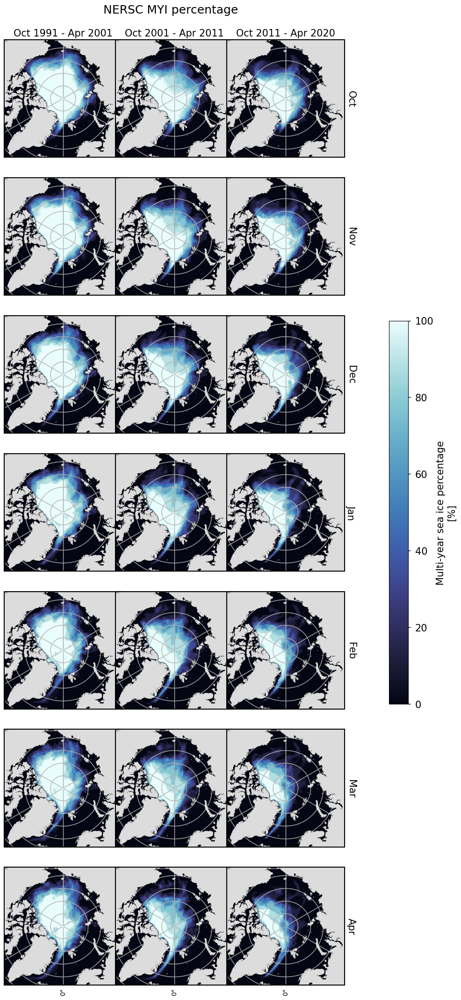

In [16]:
kw_sup = {"fontsize": 18, "x": .37, "y": 1.0125}
facet = plot_maps(ds_nersc["percentage"])
facet.fig.suptitle("NERSC MYI percentage", **kw_sup)
plt.show()

Consistent with the plots above, the maps show a significant decline in the multi-year sea ice extent since 1991, as well as throughout the boreal winters. The decline in multi-year sea ice appears to have mostly occurred in the Beaufort Sea, the Chukchi Sea, and the Eurasian Basin. On the contrary, multi-year sea ice has consistently been present in the Canadian sector and in the Greenland Sea throughout the entire period. The presence of multi-year sea ice off the coast of Greenland is noticeable and presumably due to the advection of multi-year sea ice through the Fram Strait. 

#### Maps of multi-year sea ice from CDS and "CDS - NERSC"

The Jupyter Notebook further presents four sets of maps. These are meant to help visualize the differences between the CDS and the NERSC datasets. Each set follows the same structure as the figure above. However, the first and the second sets of maps respectively show the percentage of multi-year sea ice provided by the CDS dataset for the case when the presence of multi-year sea ice is only detected using the pixels labelled as 'multi-year ice' and when the 'ambiguous' grid points are considered. The remaining sets of maps show the differences between the percentage of multi-year sea ice provided by the CDS and the NERSC datasets. The third set is produced only using the grid points of the CDS dataset that are classified as ‘multi-year ice’, whereas the one underneath uses the grid points classified as 'multi-year ice' and 'ambiguous'. 

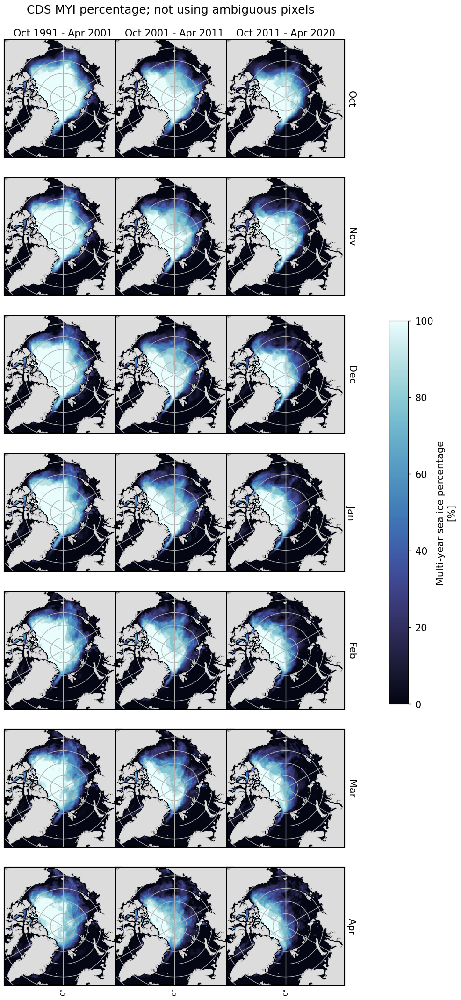

In [17]:
plot_cds_maps(ds_cds, ambiguous=False, **kw_sup)

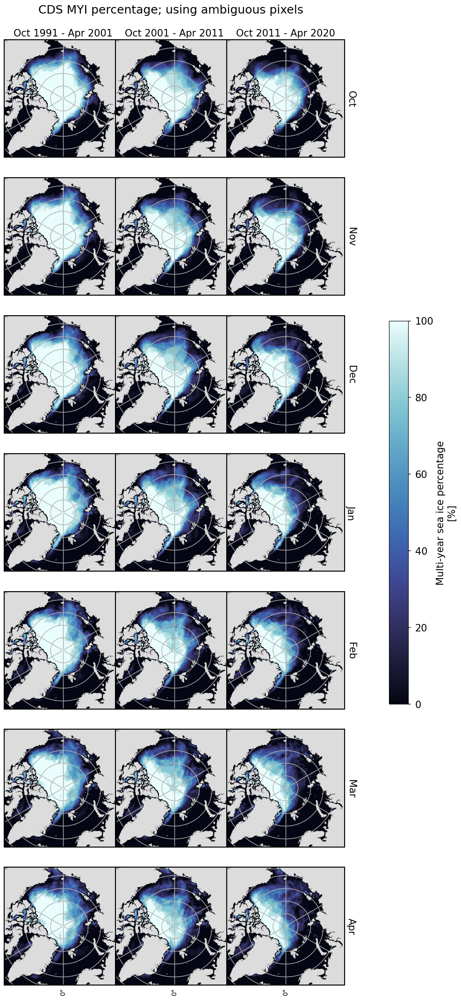

In [18]:
plot_cds_maps(ds_cds, ambiguous=True, **kw_sup)

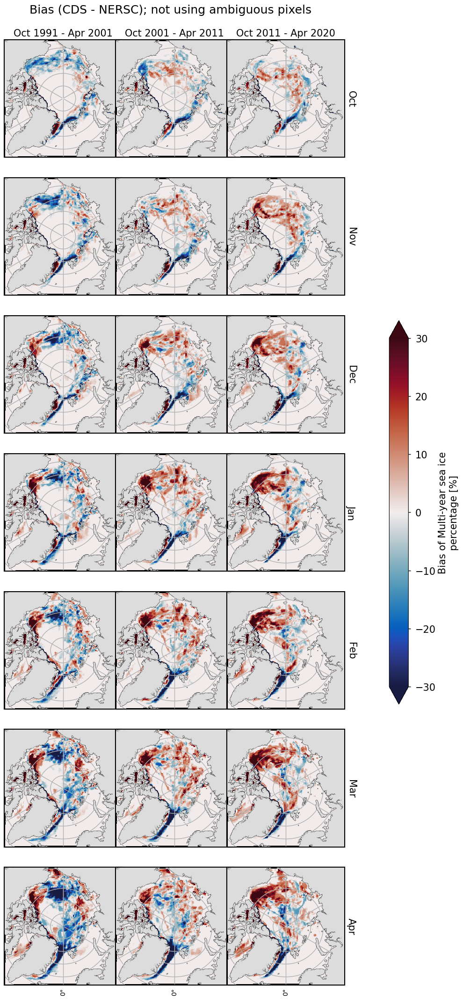

In [19]:
plot_bias_maps(da_bias, ambiguous=False, **kw_sup)

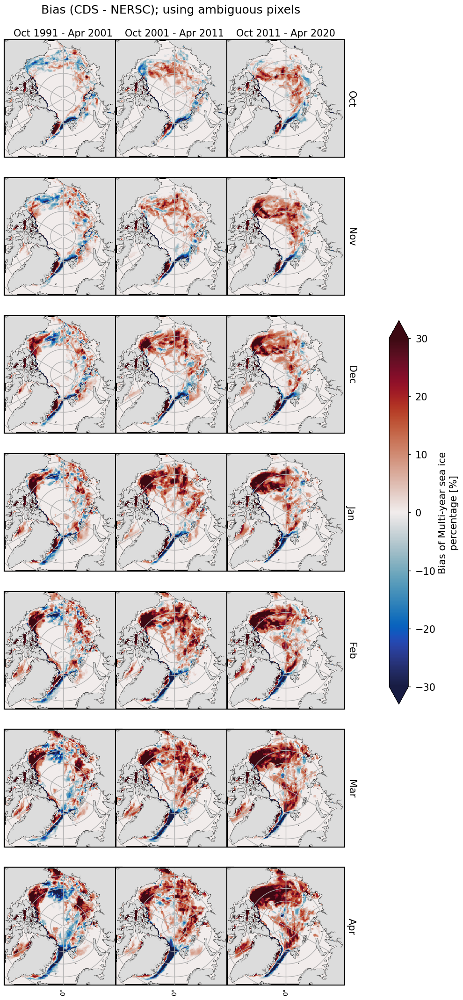

In [20]:
plot_bias_maps(da_bias, ambiguous=True, **kw_sup)

The inclusion of "ambiguous" data points primarily affects the magnitude of the difference, rather than the patterns. More precisely, when "ambiguous" values are included into the analysis, the grid points of the CDS dataset are more likely associated with multi-year sea ice and, therefore, the difference between the CDS and the NERSC datasets becomes more positive. 

Compared to the NERSC dataset, the CDS product has less multi-year sea ice in the Greenland Sea, away from the coast of Greenland. Such a discrepancy might result from the difficulty of the NERSC dataset to well capture the impact of local dynamics on multi-year sea ice. Indeed, the drifts that were used to create the NERSC dataset have a daily temporal resolution. Thus, they might not fully represent the effects of the ocean since it is highly dynamic in the region. However, the discrepancy might also highlight issues with the CDS dataset as [[3]](https://tc.copernicus.org/articles/12/2073/2018/) showed the ability of the NERSC dataset to capture multi-year sea ice in the Greenland Sea through a comparison with Sentinel-1 SAR images, used as an independent dataset, on the 1st January 2016. Therefore, further analysis is necessary to determine what causes such a discrepancy and, therefore, which dataset most reliably provides information on multi-year sea ice in the region.

More difficult is to determine the quality of the two datasets in other sectors of the Arctic. For example, compared to the NERSC dataset, the CDS dataset shows higher percentages of multi-year sea ice in the Beaufort Sea, the Chukchi Sea, and the Eurasian Basin. We might speculate that, in the Eurasian Basin, the discrepancy might occur because the CDS dataset might overestimate the amount of MYI due to its binary classification, which labels a grid point as MYI even if contains substantial amount of FYI. In contrast, when analysing the NERSC dataset we have classified a pixel as MYI if the concentration of MYI is greater than the concentration of FYI, which may lead to there being less MYI in this product than in the one by CDS. However, further analysis, for example focusing on individual years, is needed to assess the causes behind these disagreements.  

## ℹ️ If you want to know more

### Key resources

CDS dataset used:

* [Sea ice edge and type daily gridded data from 1978 to present derived from satellite observations](https://cds.climate.copernicus.eu/datasets/satellite-sea-ice-edge-type?tab=overview) 

Additional resources:

* Section "SEA-ICE" in the [State of the Global Climate 2023](https://library.wmo.int/records/item/68835-state-of-the-global-climate-2023)
* [Learning material on sea ice provided by the National Snow and Ice Data Center](https://nsidc.org/learn/parts-cryosphere/sea-ice)
* [Arctic multi-year sea ice visualization](https://svs.gsfc.nasa.gov/4251) provided by NASA
* [Sea ice as a climate indicator](https://19january2021snapshot.epa.gov/climate-indicators/climate-change-indicators-arctic-sea-ice_.html  )
* [How sea ice is observed](https://www.metoffice.gov.uk/research/climate/cryosphere-oceans/sea-ice/measure)
* [NARVAL, a visualization portal for Earth observation and model data in the high-latitude oceans](https://narval.nersc.no), offers visualizations of various sea-ice variables  

Code libraries used:

* [pandas](https://pandas.pydata.org/) 
* [xarray](https://docs.xarray.dev/en/stable/) 
* [matplotlib](https://matplotlib.org/) 
* [cmocean](https://matplotlib.org/cmocean/) 
* [cartopy](https://scitools.org.uk/cartopy/docs/latest/) 
* [C3S EQC custom functions](https://github.com/bopen/c3s-eqc-automatic-quality-control/tree/main/c3s_eqc_automatic_quality_control), `c3s_eqc_automatic_quality_control`,  prepared by [B-Open](https://www.bopen.eu/)


### References

1. Maslanik, J., Stroeve, J., Fowler, C., and Emery, W.: Distribution and trends in Arctic sea ice age through spring 2011, Geophys. Res. Lett., 38, L13502, https://doi.org/10.1029/2011GL047735, 2011.
2. Meredith, M., Sommerkorn, M., Cassotta, S., Derksen, C., Ekaykin, A., Hollowed, A., Kofinas, G., Mackintosh, A., Melbourne-Thomas, J., Muelbert, M. M. C., Ottersen, G., Pritchard, H., and Schuur, E.: Polar Regions, in: IPCC Special Report on the Ocean and Cryosphere in a Changing Climate, edited by: Pörtner, H.-O., Roberts, D. C., Masson-Delmotte, V., Zhai, P., Tignor, M., Poloczanska, E., Mintenbeck, K., Alegría, A., Nicolai, M., Okem, A., Petzold, J., Rama, B., and Weyer, N. M., chap. 3, 203–320, Cambridge University Press, Cambridge, UK and New York, NY, USA, https://doi.org/10.1017/9781009157964.005, 2019.
3. Korosov, A. A., Rampal, P., Pedersen, L. T., Saldo, R., Ye, Y., Heygster, G., Lavergne, T., Aaboe, S., and Girard-Ardhuin, F.: A new tracking algorithm for sea ice age distribution estimation, The Cryosphere, 12, 2073–2085, https://doi.org/10.5194/tc-12-2073-2018, 2018.
4. Regan, H., Rampal, P., Ólason, E., Boutin, G., Korosov, A.: Modelling the evolution of Arctic multiyear sea ice over 2000-2018, The Cryosphere, 17, 1873-1893, https://doi.org/10.5194/tc-17-1873-2023, 2023.